# **Fingerprint Matching Demo**

This demo aims to compare the performance of three different fingerprint matching algorithms: MINDTCT, SIFT, and ORB.

To participate in the demo, follow these steps:

1. **Run the provided cod**e: Execute the code to initialize the fingerprint matching environment.

2. **Choose a fingerprint**: Select either a fingerprint from the probe or the gallery.

3. **Select a matching method**: Decide which algorithm to use for the matching process. You can choose between MINDTCT, SIFT, and ORB.

4. **Click the match button**: After selecting the fingerprint and the matching method, click the "Match" button to initiate the comparison.

Stay tuned for the results and insights gained from this exciting fingerprint matching demo!

Let the comparisons begin!

## **0. Preliminaries**

**Import Libraries**

In [9]:
from skimage import io
import os
import cv2
import sys
import numpy as np
import json
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
import subprocess

In [10]:
from IPython.display import clear_output
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id':"173f52QAHqvOwityG1jVM012pErJQZiQv"}) #id_mindtct
downloaded.GetContentFile('mindtct')

downloaded = drive.CreateFile({'id':"1LgqoA0KjAL8EgAGoN2bQJFv6hknHZwYw"}) #id_
downloaded.GetContentFile('bozorth3')
clear_output()
print('Done! Press the Refresh button if files are not visible.')

Done! Press the Refresh button if files are not visible.


 **Google drive connection**

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Upload test dataset**

In [12]:
# reading fingerprint dataset
with open("/content/drive/MyDrive/biometric/DatasetFinal/test/probe_gallery.json") as json_file:
    data = json.load(json_file)
# parsing fingers into probe and gallery dictionary
for i in range(1,6):
    probe = data[str(i)]["probe"]
    gallery = data[str(i)]["gallery"]

## **Utils**

In [13]:
def plot_image(image,image2, minutiae_probe,minutiae_gallery):
      # Create copies of the images for plotting the minutiae
      image_with_minutiae = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
      image2_with_minutiae = cv2.cvtColor(image2, cv2.COLOR_GRAY2BGR)

      # Plot minutiae for the first image
      for minutia in minutiae_probe:
          x, y, angle, quality = minutia
          color = (0, 255, 0)
          cv2.circle(image_with_minutiae, (int(x), int(y)), 5, color, 2)  # Draw a circle at the minutia point

      # Plot minutiae for the second image
      for minutia in minutiae_gallery:
          x, y, angle, quality = minutia
          color = (255,0,0)
          cv2.circle(image2_with_minutiae, (int(x), int(y)), 5, color, 2)  # Draw a circle at the minutia point


      # Create a combined plot
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
      ax1.imshow(cv2.cvtColor(image_with_minutiae, cv2.COLOR_BGR2RGB))
      ax1.axis('off')

      ax2.imshow(cv2.cvtColor(image2_with_minutiae, cv2.COLOR_BGR2RGB))
      ax2.axis('off')

      plt.tight_layout()
      plt.show()

## **1. Features Extraction**


In [14]:
def extract_keypoints_from_file(file_path):
    keypoints = []

    with open(file_path, 'r') as file:
        for line in file:
            x, y, t, q = line.strip().split()
            keypoint = [float(x), float(y), int(t), int(q)]
            keypoints.append(keypoint)
    return keypoints

In [15]:
def get_descriptors(img, METHOD):
  # Harris corners
  harris_corners = cv2.cornerHarris(img, 3, 3, 0.04)
  harris_normalized = cv2.normalize(harris_corners, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32FC1)
  threshold_harris = 125
  # Extract keypoints
  keypoints = []
  for x in range(0, harris_normalized.shape[0]):
    for y in range(0, harris_normalized.shape[1]):
      if harris_normalized[x][y] > threshold_harris:
        keypoints.append(cv2.KeyPoint(y, x, 1))
  if(METHOD=="ORB"):
    orb = cv2.ORB_create()
    _, des = orb.compute(img, keypoints)
    return (keypoints, des)
  elif(METHOD=="SIFT"):
      sift = cv2.SIFT_create()
      _, des = sift.compute(img, keypoints)
      return (keypoints, des)

## **2. Matching Fingerprints**


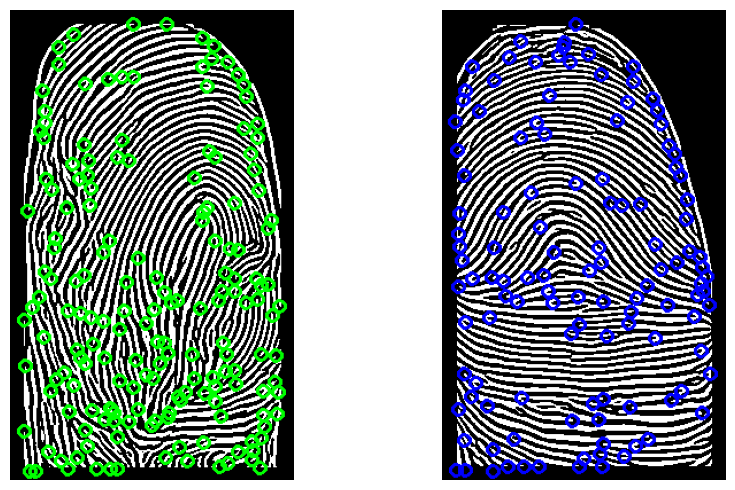

The score between 45_n_1 and 8_n_6 is: 22



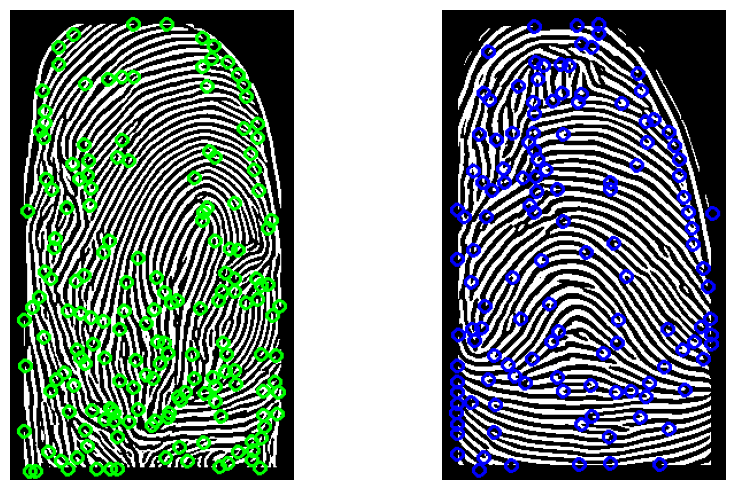

The score between 45_n_1 and 8_w_5 is: 28



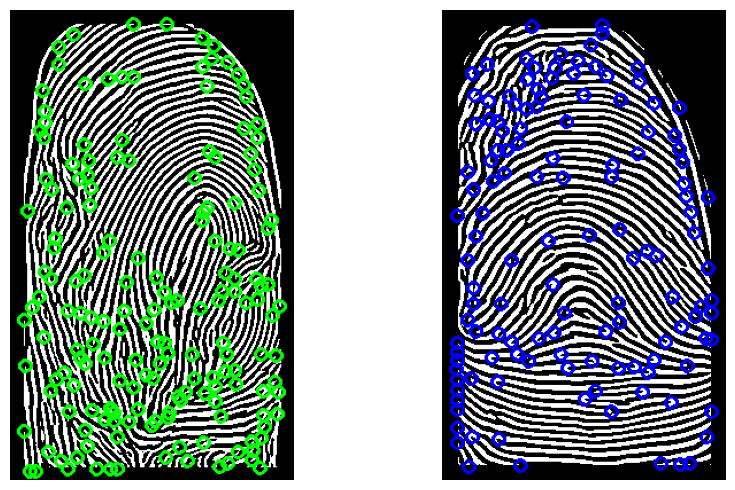

The score between 45_n_1 and 8_w_3 is: 33



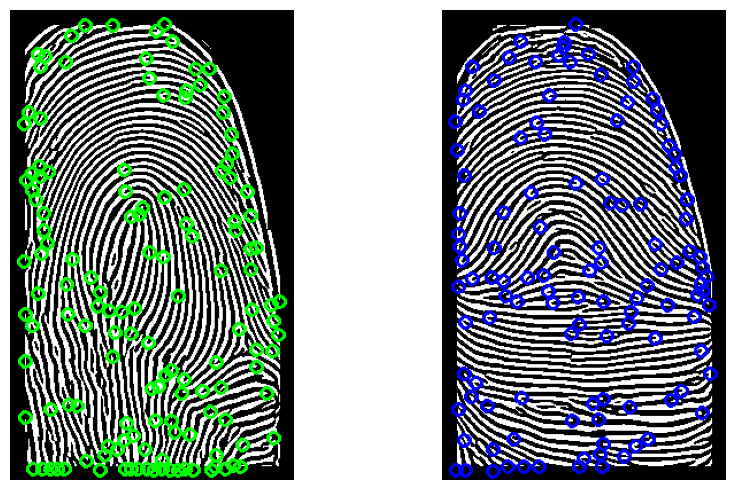

The score between 45_w_8 and 8_n_6 is: 35



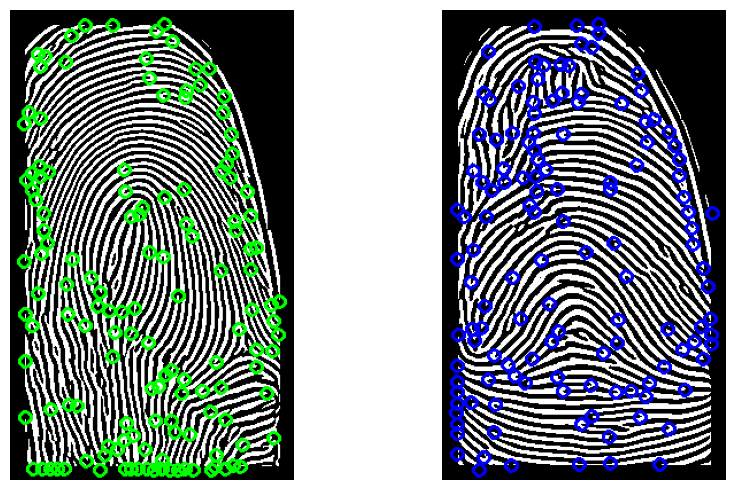

The score between 45_w_8 and 8_w_5 is: 26



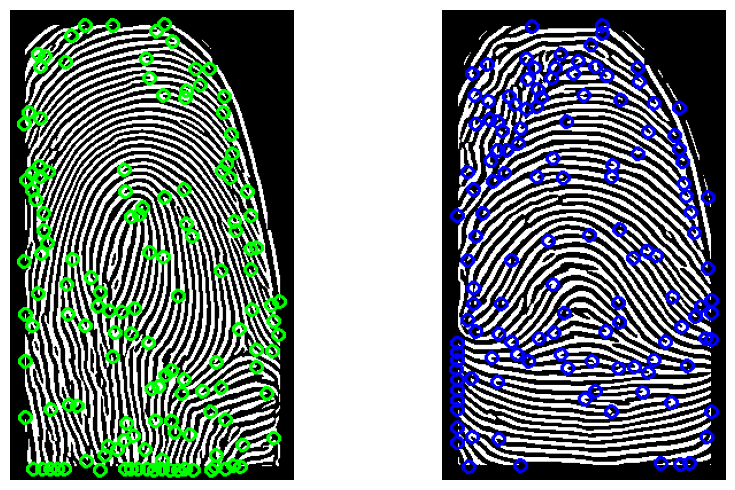

The score between 45_w_8 and 8_w_3 is: 28



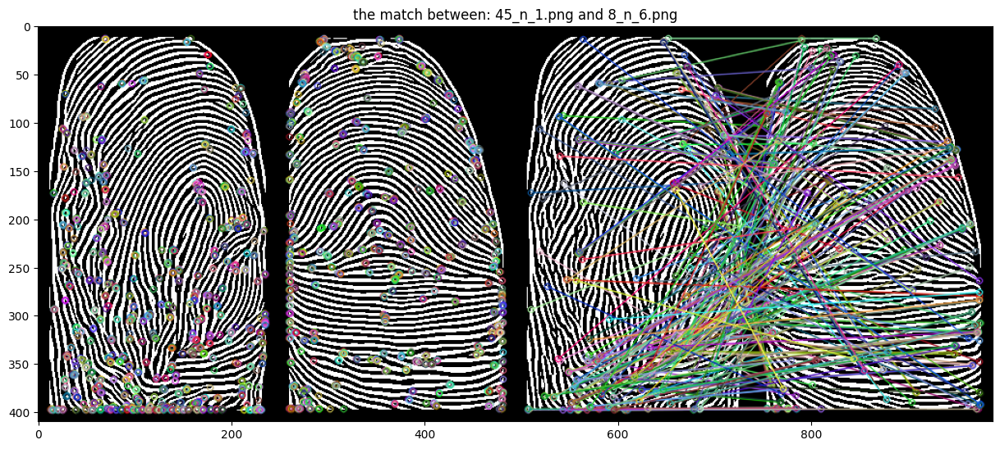

The match score between: 45_n_1.png and 8_n_6.png is 232.8744462657823 and the fingerprint does not match. 



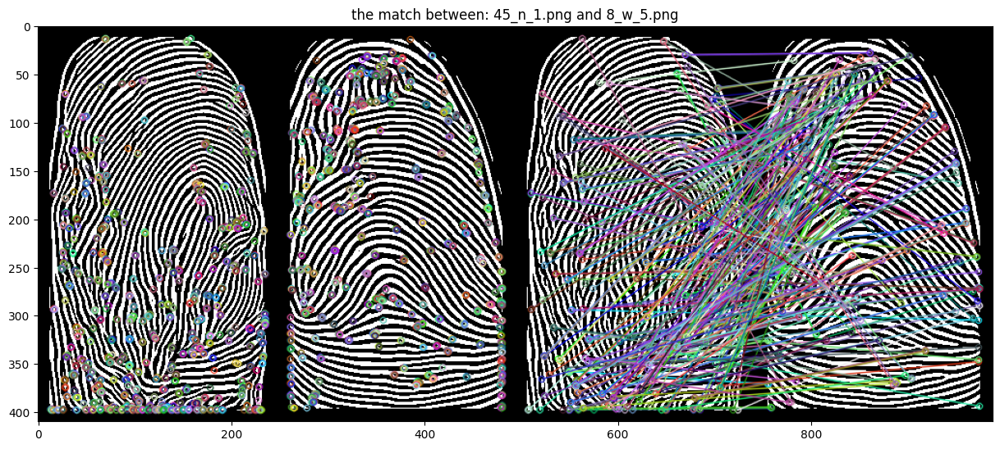

The match score between: 45_n_1.png and 8_w_5.png is 241.16707341040123 and the fingerprint does not match. 



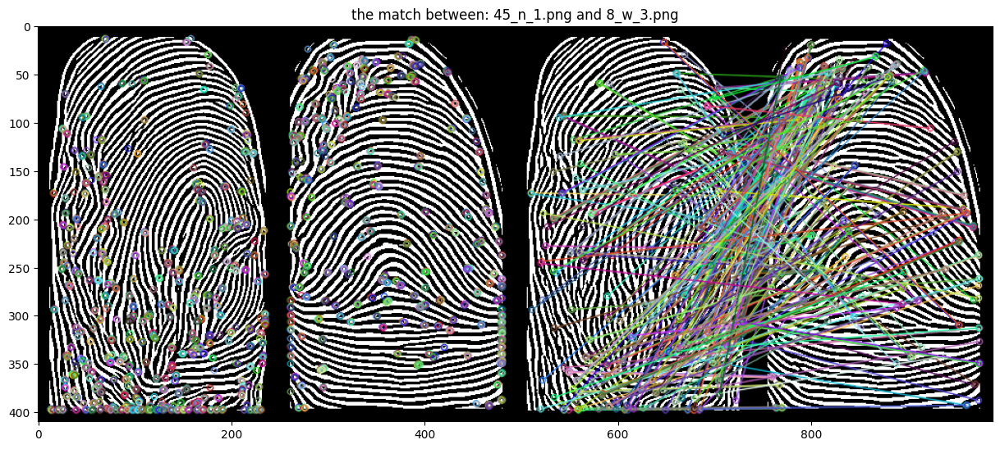

The match score between: 45_n_1.png and 8_w_3.png is 230.80256620820586 and the fingerprint does not match. 



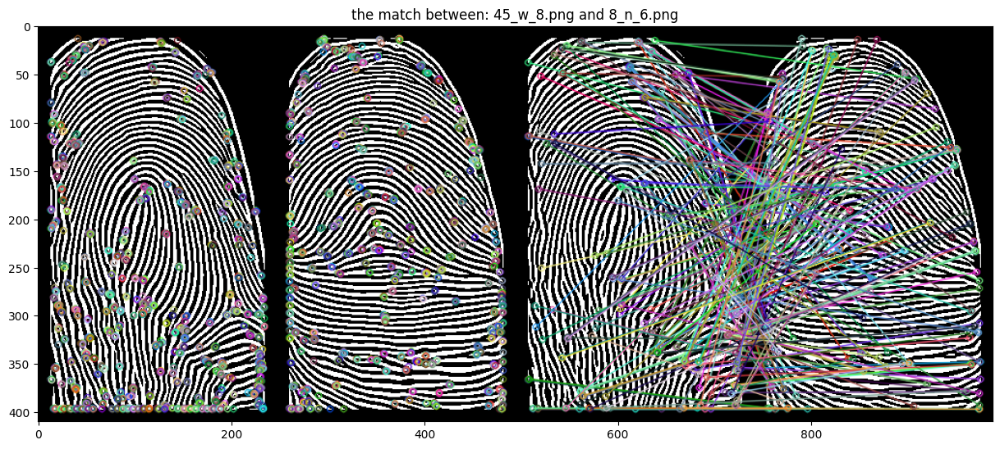

The match score between: 45_w_8.png and 8_n_6.png is 233.32475179433823 and the fingerprint does not match. 



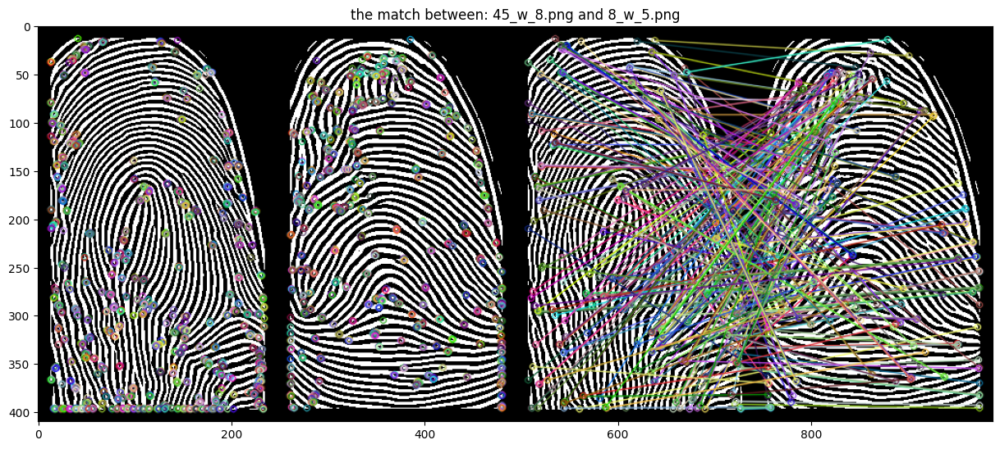

The match score between: 45_w_8.png and 8_w_5.png is 228.4943859852901 and the fingerprint does not match. 



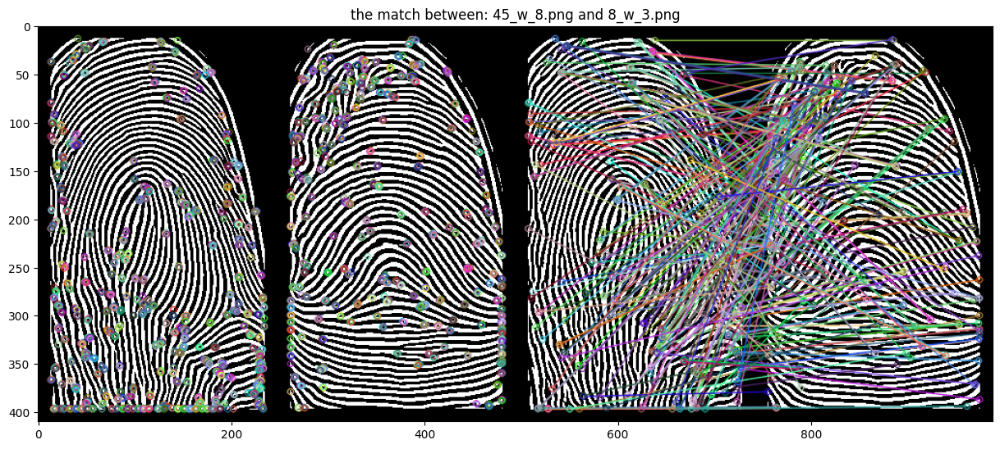

The match score between: 45_w_8.png and 8_w_3.png is 221.55490092597765 and the fingerprint does not match. 



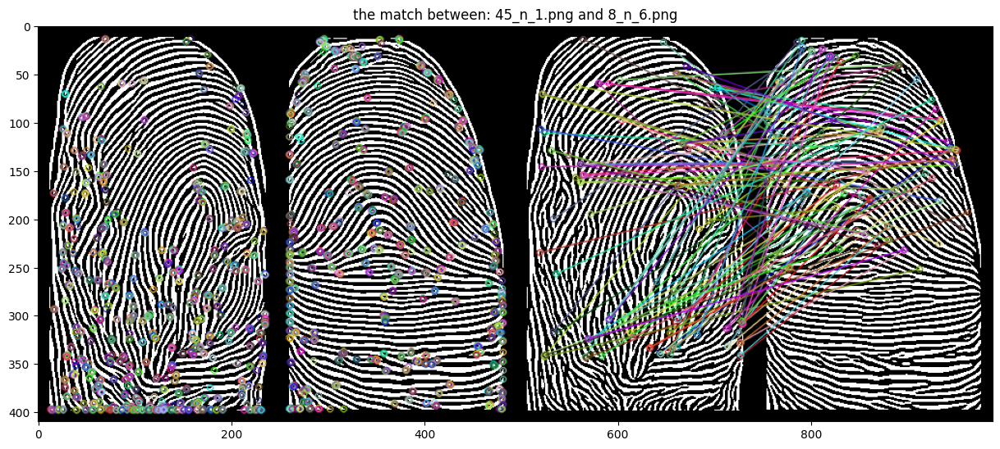

The match score between: 45_n_1.png and 8_n_6.png is 81.13761467889908 and the fingerprint does not match. 



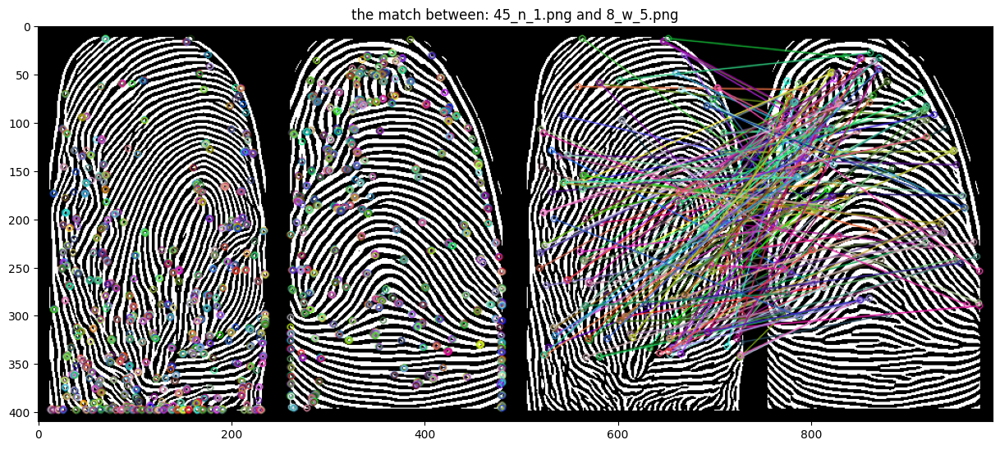

The match score between: 45_n_1.png and 8_w_5.png is 79.24590163934427 and the fingerprint does not match. 



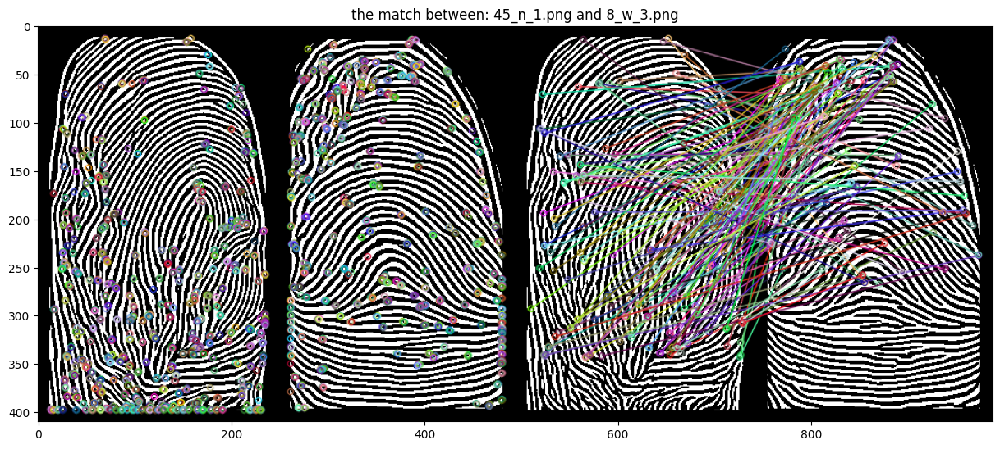

The match score between: 45_n_1.png and 8_w_3.png is 80.83229813664596 and the fingerprint does not match. 



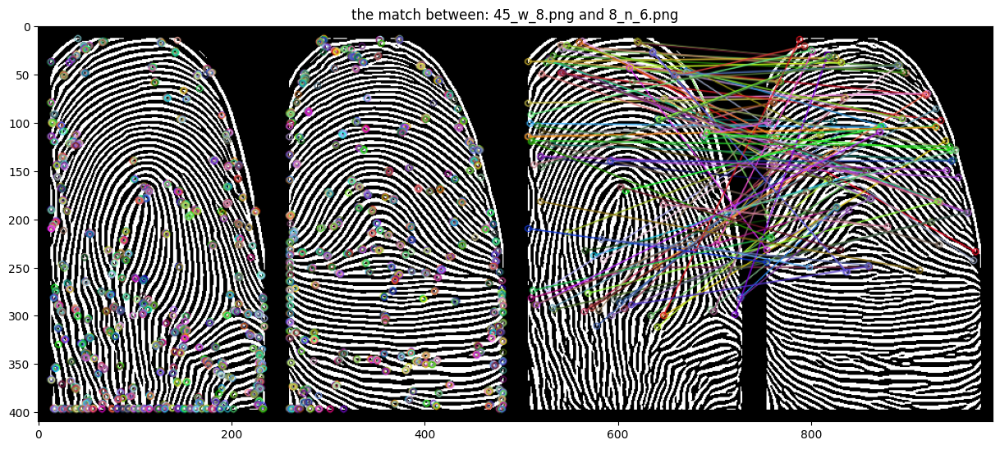

The match score between: 45_w_8.png and 8_n_6.png is 78.20952380952382 and the fingerprint does not match. 



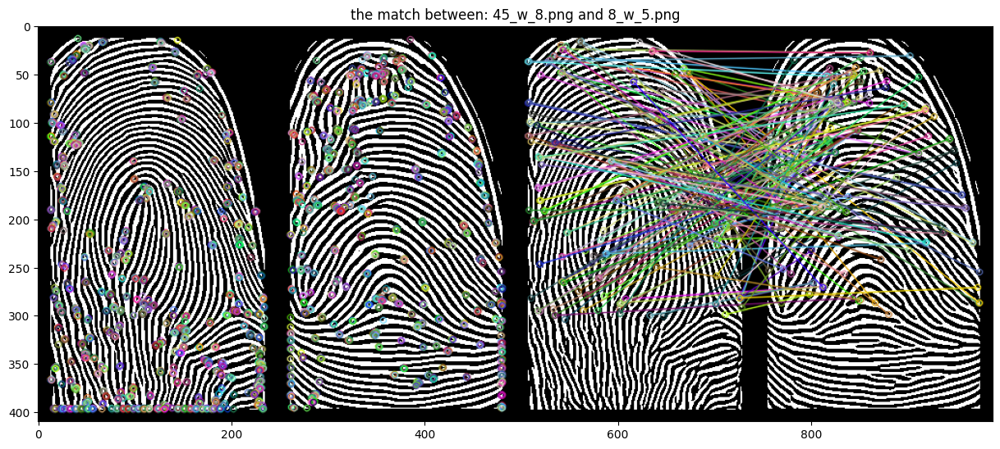

The match score between: 45_w_8.png and 8_w_5.png is 77.22151898734177 and the fingerprint does not match. 



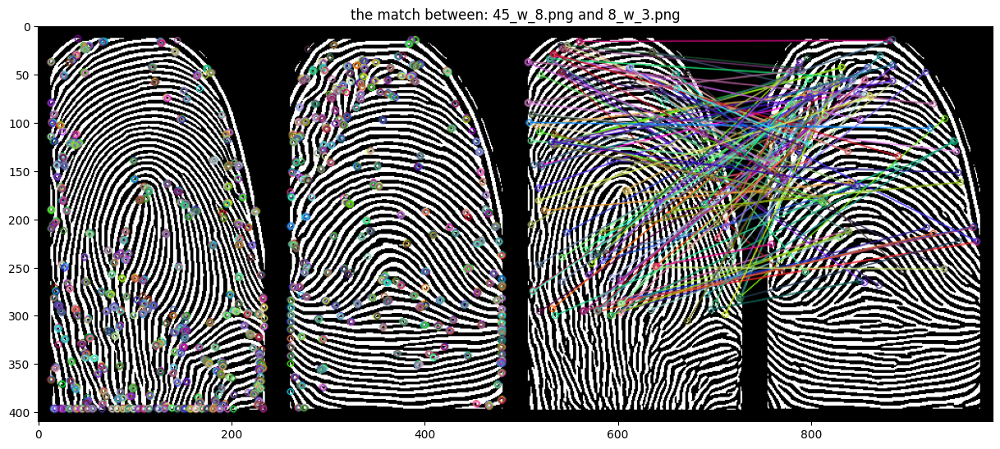

The match score between: 45_w_8.png and 8_w_3.png is 77.24812030075188 and the fingerprint does not match. 



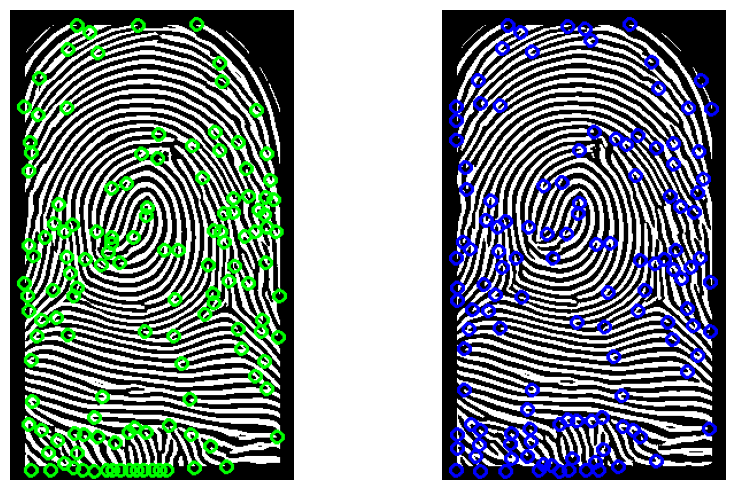

The score between 25_n_6 and 25_n_5 is: 438



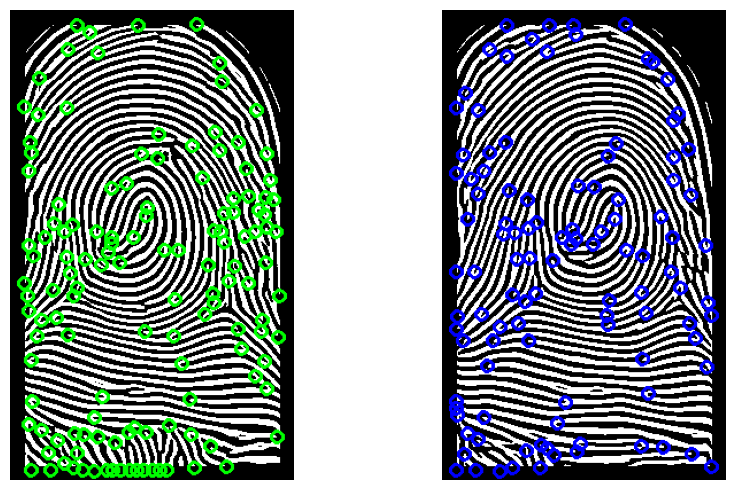

The score between 25_n_6 and 25_w_3 is: 92



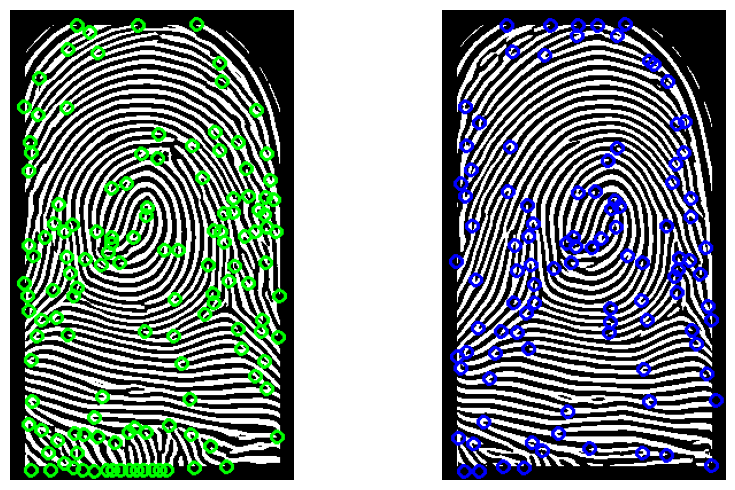

The score between 25_n_6 and 25_w_2 is: 117



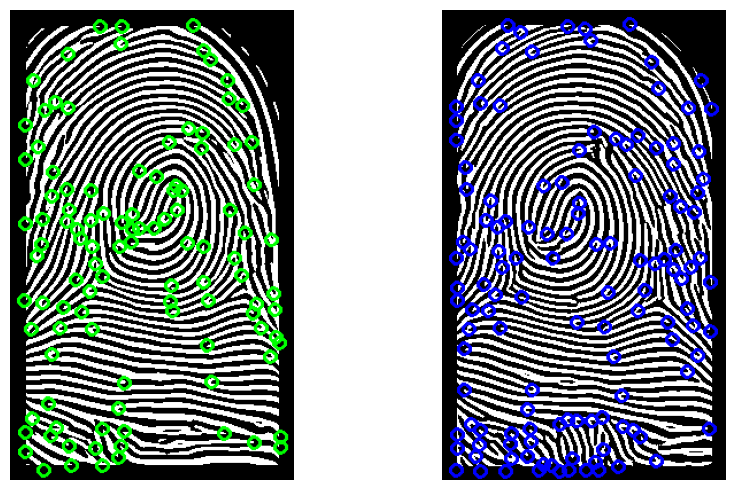

The score between 25_w_8 and 25_n_5 is: 76



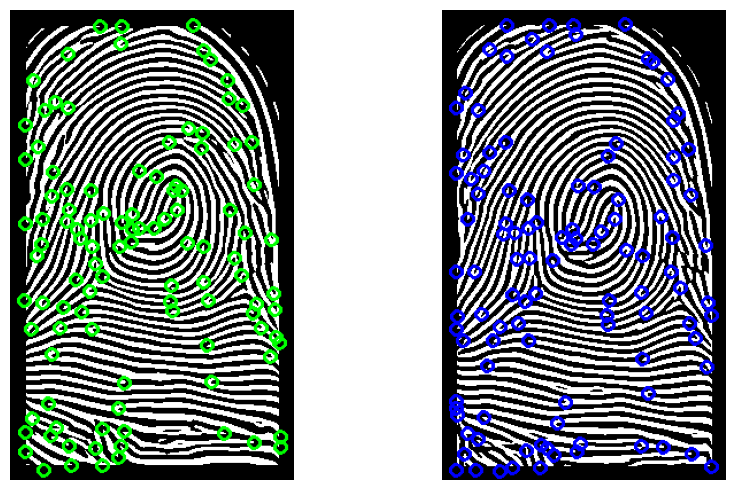

The score between 25_w_8 and 25_w_3 is: 289



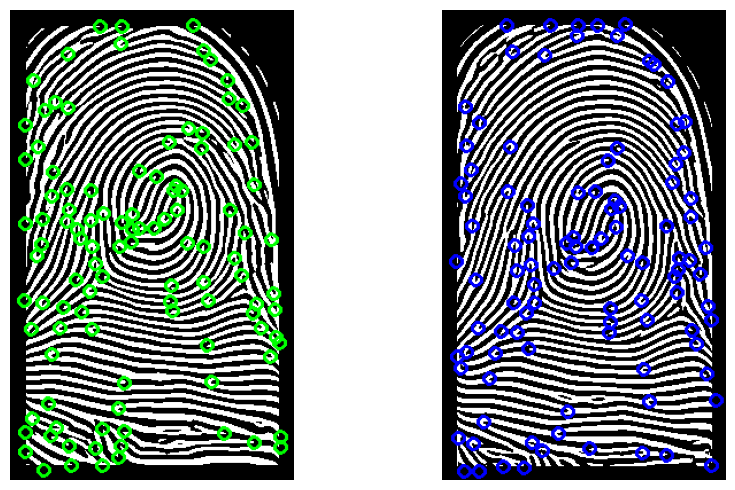

The score between 25_w_8 and 25_w_2 is: 260



In [16]:
probe_dropdown = widgets.Dropdown(options=probe.keys(), description='Probe Finger')
gallery_dropdown = widgets.Dropdown(options=gallery.keys(), description='Gallery Finger')
method_dropdown = widgets.Dropdown(options=['ORB', 'SIFT', 'MINDTCT'], description='Method')

# GUI event handler
def match_button_clicked(b):
    probe_finger = probe_dropdown.value
    gallery_finger = gallery_dropdown.value
    METHOD = method_dropdown.value
    output_images.children = []  #

    for finger_x in probe[probe_finger]:
        for finger_y in gallery[gallery_finger]:
            path_x = "/content/drive/MyDrive/biometric/DatasetFinal/test/" + finger_x
            path_y = "/content/drive/MyDrive/biometric/DatasetFinal/test/" + finger_y
            img1 = cv2.imread(path_x, 0)
            img2 = cv2.imread(path_y, 0)

            if(METHOD=="ORB" or METHOD=="SIFT"):
                kp1, des1 = get_descriptors(img1, METHOD)
                kp2, des2 = get_descriptors(img2, METHOD)
                if METHOD == "ORB":
                    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
                else:
                    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
                matches = sorted(bf.match(des1, des2), key=lambda match: match.distance)

                img4 = cv2.drawKeypoints(img1, kp1, outImage=None)
                img5 = cv2.drawKeypoints(img2, kp2, outImage=None)
                img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches, flags=2, outImg=None)
                combined_img = np.concatenate((img4, img5, img3), axis=1)
                # Create a figure and plot the combined image
                fig, ax = plt.subplots(figsize=(15, 20))
                ax.imshow(combined_img)
                ax.set_title("the match between: " + finger_x + " and " + finger_y )
                plt.show()
                score = 0
                for match in matches:
                    score += match.distance
                score_threshold = 68
                if score / len(matches) < score_threshold:
                    does_match = "fingerprint matches."
                else:
                    does_match = "fingerprint does not match."
                print("The match score between: " + finger_x + " and " + finger_y + " is \033[91m" + str(score / len(matches)) + "\033[0m and the\033[91m " + does_match + "\033[0m \n")

            elif(METHOD=="MINDTCT"):
                #mindtct
                probe_path = '/content/drive/MyDrive/biometric/DatasetFinal/test/'
                gallery_path = '/content/drive/MyDrive/biometric/Demo/test/'
                !chmod 755 mindtct
                !chmod 755 bozorth3

                cmd1='/content/mindtct -m1 '+ probe_path + finger_x+ ' ' + gallery_path+ finger_x[:-4]
                cmd2='/content/mindtct -m1 '+ probe_path + finger_y+ ' ' + gallery_path+ finger_y[:-4]
                os.system(cmd1)
                os.system(cmd2)

                #bozorth3
                probe_fingerprint = '/content/drive/MyDrive/biometric/Demo/test/' +finger_x[:-4]+".xyt"
                gallery_fingerprint = '/content/drive/MyDrive/biometric/Demo/test/'+ finger_y[:-4]+".xyt"
                cmd3 = '/content/bozorth3 -m1 '+ probe_fingerprint + ' ' + gallery_fingerprint
                minutiae_probe=extract_keypoints_from_file(probe_fingerprint)
                minutiae_gallery=extract_keypoints_from_file(gallery_fingerprint)
                image = io.imread(path_x)
                image2=io.imread(path_y)
                plot_image(image, image2,minutiae_probe, minutiae_gallery)
                print("The score between "+finger_x[:-4]+ " and " + finger_y[:-4]+ " is:",subprocess.check_output(cmd3, shell=True).decode("utf-8"))

# Create a visually appealing button for Google Colab
match_button = widgets.Button(description='Match!')
match_button.style.button_color = '#6495ED'  # Set a light blue color
match_button.layout.width = '200px'
match_button.layout.height = '80px'
match_button.layout.margin = '20px auto'
match_button.layout.border = 'none'  # Remove the button border
match_button.layout.border_radius = '10px'  # Apply rounded corners

output_images = widgets.HBox()

# Attach event handler to the button
match_button.on_click(match_button_clicked)

# Modify the container layout for the dropdowns
dropdown_container = widgets.HBox([probe_dropdown, gallery_dropdown, method_dropdown])
dropdown_container.layout.justify_content = 'center'
dropdown_container.layout.margin = '20px'
dropdown_container.layout.padding = '10px'
dropdown_container.layout.border = '1px solid lightgray'  # Add a light gray border
dropdown_container.layout.border_radius = '10px'  # Apply rounded corners

# Display the GUI elements
display(widgets.VBox([dropdown_container, match_button]))
